##Задание 1

In [ ]:
%pip install vk
%pip install vk_api

In [ ]:
import vk, vk_api

https://oauth.vk.com/authorize?client_id=51752593&display=page&redirect_uri=https://oauth.vk.com/blank.html&response_type=code&v=5.131

https://oauth.vk.com/access_token?client_id=51752593&client_secret=MIvWJSLJE5eXEvpSuMQU&redirect_uri=https://oauth.vk.com/blank.html&code=260b421801dc88dbeb

In [ ]:
access_token = 'vk1.a.dOzWj1DWJ9BAjg75Pu7MAYtuyOob5Rvs7Toh888Td1rX6Q76BTl2gtQcPcN1vE3SlZvF8u1AnOm9cmxKnq7cvVrp_L5t7_pKGujN-_6kxDAlZlfh-fEv2k05FEdU_tPb9ZBEokjLyWKigFtOqiN23xLrkEXyIsoogBcdQgptUSLXftvJOOKsu0hWW5tydSqS'

In [ ]:
vk_session = vk_api.VkApi(token = access_token)
vk = vk_session.get_api()

In [ ]:
my_id = 253450204

In [ ]:
users = vk.users.get(user_id = my_id, fields = 'first_name, last_name, bdate, city, education')
users

[{'id': 253450204,
  'bdate': '20.5.2004',
  'city': {'id': 312, 'title': 'Мытищи'},
  'university': 239,
  'university_name': 'НИТУ МИСИС',
  'faculty': 0,
  'faculty_name': '',
  'graduation': 2026,
  'first_name': 'Екатерина',
  'last_name': 'Горячева',
  'can_access_closed': True,
  'is_closed': False}]

In [ ]:
import pandas as pd
dff = pd.DataFrame([users[0]])
dff

,id,bdate,city,university,university_name,faculty,faculty_name,graduation,first_name,last_name,can_access_closed,is_closed
0,253450204,20.5.2004,"{'id': 312, 'title': 'Мытищи'}",239,НИТУ МИСИС,0,,2026,Екатерина,Горячева,True,False


Задание 2

In [ ]:
import requests
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

In [ ]:
def get_friends(user_id):
  try:
    users = vk.friends.get(user_id = user_id, fields = 'first_name, last_name')
    return users["items"]
  except:
    return []

central_users = get_friends(my_id)
central_users = {user_dict['id']: user_dict.get('first_name')+ " " +user_dict.get('last_name')
                 for user_dict in central_users}
central_users[my_id] = 'Я'

In [ ]:
central_users

In [ ]:
#for friend_id in central_users.keys():
#  friends_users = get_friends(friend_id)
#  friends_users = {user_dict['id']: user_dict.get('first_name')+ " " +user_dict.get('last_name')
#                 for user_dict in friends_users}

In [ ]:
#friends_users

In [ ]:
import time
import random
graph = {}

for user_id in central_users.keys():
    friends_users = get_friends(user_id)
    friends_users = [user_dict['id']
                  for user_dict in friends_users]
    graph[user_id] = friends_users
    time.sleep(random.randint(1, 10) / 100)

In [ ]:
graph

In [ ]:
uniqie_users = set(graph.keys())

In [ ]:
g = nx.Graph()
for user_id, user_friends in graph.items():
    g.add_node(central_users[user_id])
    for friends_id in user_friends:
        if friends_id in central_users:
            g.add_edge(central_users[user_id], central_users[friends_id])

In [ ]:
def graph_plot():
    plt.figure(figsize=(12, 9))
    nx.draw_kamada_kawai(g, with_labels=False, node_size=50, width=0.5)
    plt.show()

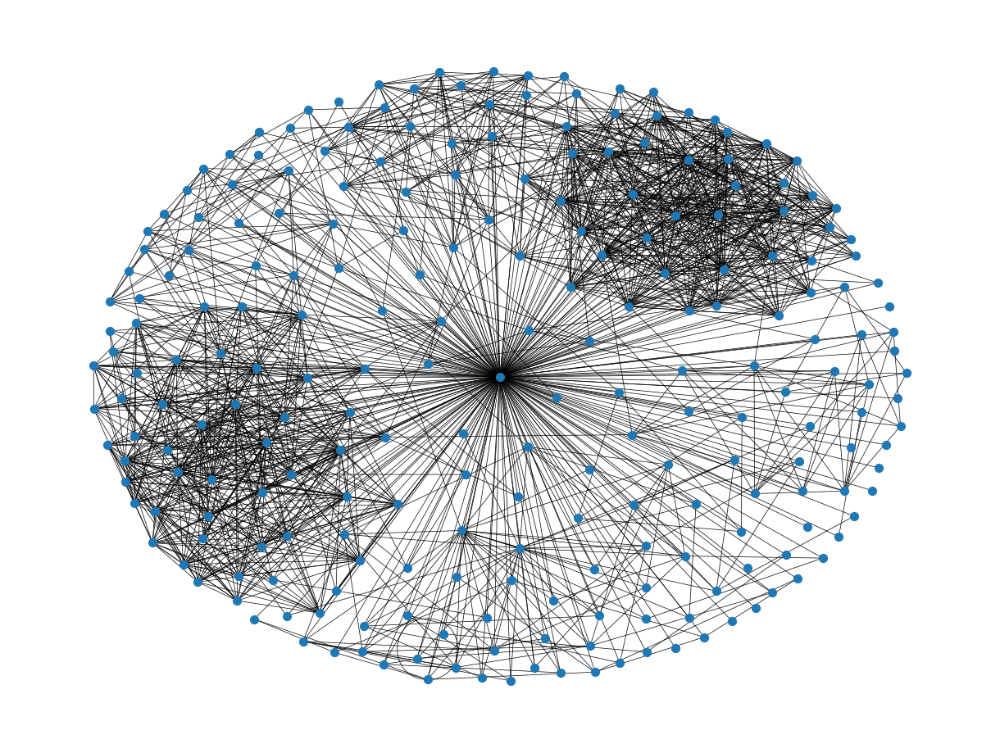

In [ ]:
graph_plot()

In [ ]:
g.remove_node(central_users[my_id])

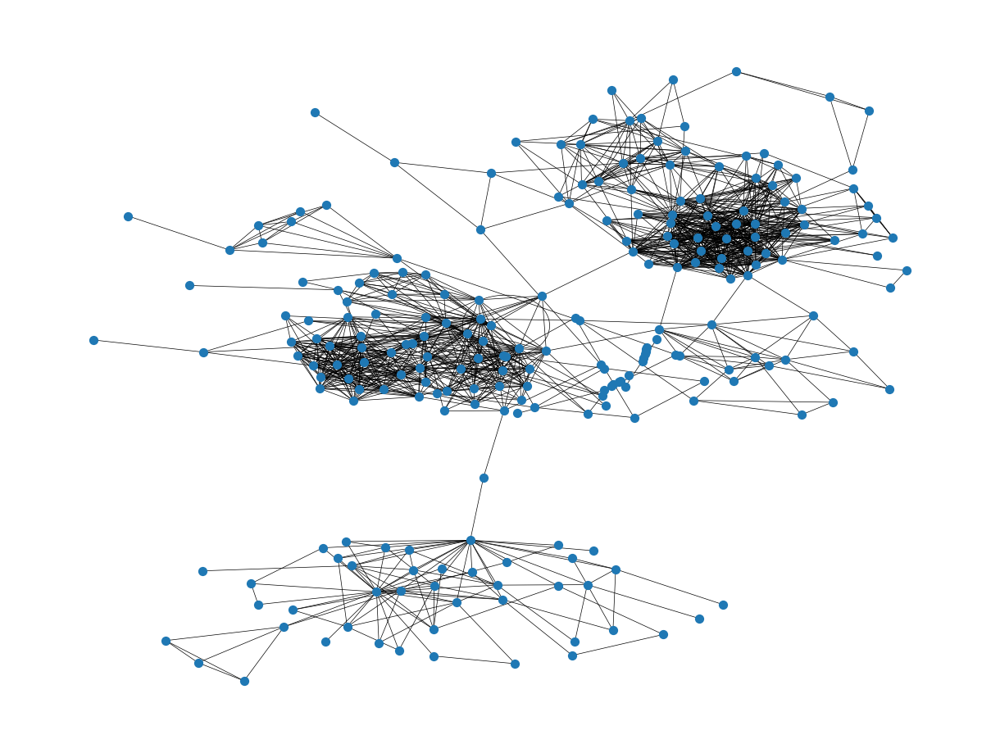

In [ ]:
graph_plot()

In [ ]:
def graph_plot2():
    plt.figure(figsize=(12, 9))
    nx.draw_kamada_kawai(g, with_labels=True, node_size=50, width=0.5)
    plt.show()

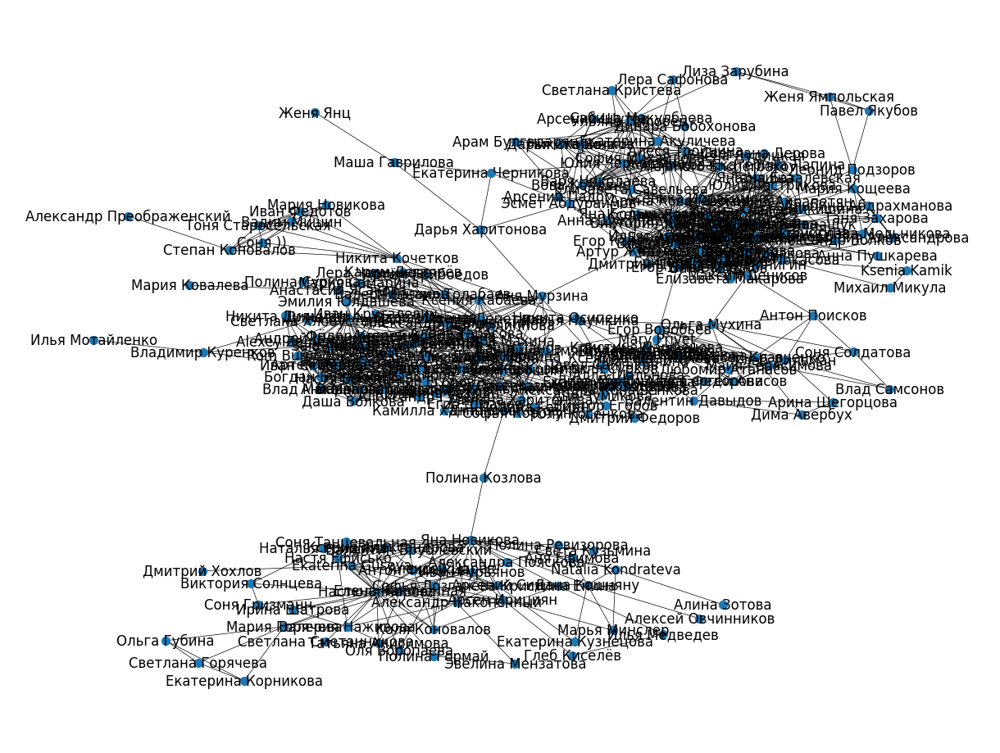

In [ ]:
graph_plot2()

In [ ]:
def graph_plot_save(name):
    plt.figure(figsize=(120, 90))
    nx.draw_kamada_kawai(g, with_labels=True, node_size=50, width=0.5)
    plt.savefig(name)

In [ ]:
graph_plot_save('my_friends.png')

кластеры: верхний - школа, средний - вуз, нижний - оздоровительный санаторий, в сеередине справа - олимпиадный летний лагерь при мфти

часть с получением моих друзей на карте России

In [ ]:
import time
import random

def get_friends_country(user_id):
  try:
    users = vk.friends.get(user_id = user_id, fields = 'id, city,country')
    return users["items"]
  except:
    return []

In [ ]:
city = get_friends_country(my_id)
friends_city = []

In [ ]:
city

In [ ]:
for friend in city:
  if 'city' in friend:
        friends_city.append({'id': friend['id'], 'city': friend.get('city')['title']})

#if 'city' in city[0]:
#friends_city.append({'id': friend['id'], 'city': friend.get('city')['title']})

friends_city_table = pd.DataFrame(data=friends_city)
friends_city_table.head()

In [ ]:
friends_city_table['city'].value_counts()

Москва             102
Мытищи              23
Королёв              4
Сергиев Посад        4
Санкт-Петербург      3
Нижний Новгород      2
Тула                 2
Abu Dhabi            1
Mâcon                1
Paris                1
Los Angeles          1
Уфа                  1
Курск                1
Воронеж              1
Омск                 1
San Francisco        1
Новокузнецк          1
Дмитров              1
Томск                1
Деденево             1
Саратов              1
Alicante             1
Печора               1
Chicago              1
Щелково              1
Краснодар            1
Орёл                 1
Name: city, dtype: int64

In [ ]:
friends_city_table['city'].value_counts().to_csv('friends_city.csv')

работа с геокодером

In [ ]:
API_KEY = '1132f64f-65b9-4a4f-9330-208002aab3f1'

In [ ]:
%pip install requests
%pip install clickhouse-driver

In [ ]:
import requests
from dataclasses import dataclass

@dataclass
class YandexGeocoder:
    api_key: str
    geocoder_url: str = 'https://geocode-maps.yandex.ru/1.x'

    def adress_to_geopoint(self, address: str) -> str:
        response = requests.get(self.geocoder_url, params={
            'apikey': self.api_key,
            'geocode': address,
            'format': 'json',
        })
        response.raise_for_status()

        result = response.json()['response']['GeoObjectCollection']['featureMember']
        if not result:
            return None

        lat, lon = result[0]['GeoObject']['Point']['pos'].split(' ')
        return self._to_datalens_format(lon, lat)

    def _to_datalens_format(self, lon, lat):
        return f'[{lon},{lat}]'

In [ ]:
geocoder = YandexGeocoder(api_key=API_KEY)

In [ ]:
encoded_data = []
for friend in friends_city:
    address = friend['city']
    s = geocoder.adress_to_geopoint(address)
    encoded_data.append([s, friend['city']])
encoded_data[:10]

In [ ]:
encoded_df = pd.DataFrame(data=encoded_data, columns=['coords', 'city'])
encoded_df

In [ ]:
encoded_df.to_csv('coords.csv')

Задание 3 - Челябинск (158)

In [ ]:
chek_users = []
popular_women = []
popular_men = []
count = 0

for i in range(1,29):
  chel_users_all_date = vk.users.search(fields = 'id, sex, bdate',
                                     city = 158, birth_day = i,
                                     count = 1000)
  chel_users_all = chel_users_all_date['items']

  for dict in chel_users_all:
    if 'bdate' in dict:
      if len(dict['bdate']) > 7:
        if dict['sex']==1 or dict['sex']==2:
          if count < 10000:
            count+=1
            chek_users.append(dict)

In [ ]:
women = []
men = []
years = []

for dict in chek_users:
  day, month, year = dict['bdate'].split('.')
  years.append(year)
  if dict['sex']==1:
    women.append({'years': year})
  else:
    men.append({'years': year})

chel_years = set(years)
chel_years

In [ ]:
dfwomen = pd.DataFrame(women)
dfwomen.describe(include = 'all')
dfwomen['years'].value_counts()

In [ ]:
dfmen = pd.DataFrame(men)
dfmen.describe(include = 'all')
dfmen['years'].value_counts()

In [ ]:
dfwomen['years'].value_counts().to_csv('dfwomen.csv')
dfmen['years'].value_counts().to_csv('dfmen.csv')

Ссылка на дашборд

In [ ]:
https://datalens.yandex.ru/2a00o5limoyqr-hw-1-2

задание на имена

In [ ]:
cnt1 = 0
random_users_name = []
women_name = []
men_name = []

for i in range(1, 29):
    users1 = vk.users.search(fields = 'id, sex, first_name', city = 158, birth_day = i, count = 1000)
    new_massiv1 = users1['items']
    for dict in new_massiv1:
        if 'sex' in dict:
            if ((dict['sex'] == 1) or (dict['sex'] == 2)):
                    if (cnt1 < 10000):
                        cnt1+=1
                        random_users_name.append(dict)

#len(random_users_name)

In [ ]:
for dict in random_users_name:
  if dict['sex']==1:
    women_name.append({'name_w': dict['first_name']})
  if dict['sex']==2:
    men_name.append({'name_m': dict['first_name']})

#len(men)

In [ ]:
dfwomen_name = pd.DataFrame(women_name)
dfwomen_name.describe(include = 'all')
dfwomen_name['name_w'].value_counts()

Анастасия    554
Екатерина    426
Мария        390
Анна         324
Дарья        306
            ... 
Moon           2
Dora           2
Asuka          2
Евгений        2
Xzzxcxz        2
Name: name_w, Length: 898, dtype: int64

самое популряное женское имя в городе Челябинск - Анастасия (554)

In [ ]:
dfmen_name = pd.DataFrame(men_name)
dfmen_name.describe(include = 'all')
dfmen_name['name_m'].value_counts()

Александр       532
Никита          286
Дмитрий         276
Андрей          270
Максим          260
               ... 
Mjeaw             2
Единственный      2
Иоанн             2
Abu               2
Синед             2
Name: name_m, Length: 937, dtype: int64

самое популярное мужское имя - Александр (532)

In [ ]:
dfwomen_name['name_w'].value_counts().to_csv('dfwomen_name.csv')
dfmen_name['name_m'].value_counts().to_csv('dfmen_name.csv')